## <center>Visual study of the winding number of a closed path in the  complex plane. The Argument Principle</center> 

This notebook is dedicated to the so called *Argument Principle* for  meromorphic functions. More precisely we visualize the geometric version of this  principle, which allows 
 to identify zeros and singularities in a [colored representation of a complex valued function](http://nbviewer.ipython.org/github/empet/Math/blob/master/DomainColoring.ipynb). 

The Argument Principle relates the number of zeros and singularities of a function with the so called    winding number of a  loop  encircling these points.

We present the winding number  both theoretically and visually (animated).

### Winding number of a closed loop with respect to a point

 
A closed path or loop in the  complex plane is defined by a continuous function $\gamma:[a,b]\to\mathbb{C}$, such that
$\gamma(a)=\gamma(b)$. The range or image of the function $\gamma$ is a curve $\Gamma=im(\gamma)$ in the complex plane. 

The path can be interpreted as defining the motion of a point  on the curve $\Gamma$, during the interval of time $[a,b]$.

For example $\gamma(t)=z_0+re^{2\pi i t}$, $t\in[0,1]$, defines a  loop. The moving point describes
a circle centered at   $z_0$ and of radius $r$.



A loop $\gamma:[a,b]\to\mathbb{C}$ which has no selfintersections, except for $\gamma(a)=\gamma(b)$,   is called *simple loop*. 

$\gamma(t)=z_0+re^{2\pi i t}$ defines  a simple loop for $t\in[0,1]$, but not for $t\in[0,2]$.

A simple loop $\gamma$  divides the complex plane into two  regions, whose common boundary is the curve
$\Gamma=im(\gamma)$. The bounded region is usually called the *region inside* $\Gamma$.

Let  $z_0$ be a point in the complex plane and  $\gamma:[a,b]\to\mathbb{C}\setminus\{z_0\}$  a loop not passing through $z_0$. The  *winding number* of  $\gamma$  with respect to $z_0$ is, intuitively, the number of times the moving point $\gamma(t)$  winds around  $z_0$, as $t$ varies in $[a,b]$.
We denote this number by $wind(\gamma, z_0)$. 



In order to give a formal definition of the winding number we consider first loops that avoid 0,
and are defined (eventually through a reparameterization) on the interval $[0,1]$.

If  $\gamma:[0,1]\to\mathbb{C}\setminus \{0\}$ is a loop, then 
 there exists  a continuous path  $\eta:[0,1]\to\mathbb{C}$, such that $$\gamma(t)=e^{\eta(t)}=r(t)e^{i \varphi(t)}, \quad\forall\: t\in [0,1]$$

The real functions  $r(t)$ and $\varphi(t)$ are obviously continuous, and they are  uniquely defined up to multiples of $2\pi$.

The real function $\varphi(t)$ unwraps the argument of $\gamma(t)$. In Complex Analysis it  is called a *continuous branch of the argument along* $\gamma(t)$, whereas
    in Topology  the function $\varphi/2\pi$ is
*a lift of the path* $t\mapsto \displaystyle\frac{\gamma(t)}{|\gamma(t)|}$  in the unit circle $\mathbb{S}^1=\mathbb{R}/\mathbb{Z}$,
to a path in $\mathbb{R}$.

Since $\gamma$ is a loop
we have $\gamma(0)=\gamma(1)$ $\Leftrightarrow$ $r(0)e^{i\varphi(0)}=r(1)e^{i\varphi(1)}$
$\Leftrightarrow$  $r(0)=r(1)$ and $\varphi(1)-\varphi(0)=2 k\pi$, where $k$ is an integer.


By definition [P. Henrici, Applied and computational complex analysis, Vol 1,](http://www.amazon.com/Computational-Analysis-Integration-Conformal-Location/dp/0471608416) the integer $k$ is *the winding number of the loop* with respect to $0$, $k=wind(\gamma,0)$.

It gives the total continuous  variation of the angle along  the loop.  

If a loop $\gamma$ avoids a point $z_0$, then the loop $\xi$,  $\xi(t)=\gamma(t)-z_0$, avoids $0$, and thus one defines the winding number of $\gamma$ with respect to $z_0$ as being $wind(\gamma, z_0)=wind(\xi, 0)$.



- The winding number is positive when the path $\gamma$ is positively oriented ($\gamma(t)$ moves anticlockwise on the underlying curve $\Gamma$, as $t$ increases from $a$ to $b$). 
- It is negative when $\gamma$ is negatively oriented, and $0$ when $z_0$ is "outside" the curve $\Gamma$.


In order to get more insight into this notion,
we take a loop and animate the motion of the vector  $\overrightarrow{z_0\gamma(t)}$ about $z_0$, as $\gamma(t)$ is running along the curve $\Gamma$, from its starting point $\gamma(0)$, and back.

To activate and display  the animation within the IPython Notebook we call the  function `matplotlib.animation` and import the package [JSAnimation](https://github.com/jakevdp/JSAnimation).

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
rcdef = plt.rcParams.copy()

In [2]:
from matplotlib import animation
from JSAnimation import IPython_display

def winding(Gamma, z0, xm, xM, ym, yM):
   #Gamma is an array of N complex numbers, representing the values of gamma(t) at 
   # t=np.linspace(0,1, N)
   #xm, xM, ym, yM are  axes limits 
    
   nr=Gamma.real.shape[0]
    
   def init():
       v=ax.quiver( [], [], [], [], color=(0.45,0.45, 0.45), scale_units='xy', angles='xy',
                scale=1, linewidth=.1)
       return v,
            
   def animate(i):
       v.set_UVC(Gamma[i].real,Gamma[i].imag)
       return   v,

   fig = plt.figure()
   ax = fig.add_subplot(111,   xlim=(xm, xM), ylim=(xm, xM))
   ax.grid()
   ax.plot(Gamma.real, Gamma.imag, 'g', lw=2)
   ax.plot(Gamma[0].real, Gamma[0].imag, 'ro') #the starting point  
   ax.plot(z0.real, z0.imag, color=(0.45,0.45, 0.45), marker='o')     
   X=[]
   Y=[]
   X.append(z0.real)
   Y.append(z0.imag) 
   v=ax.quiver( X, Y, [], [], color=(0.45,0.45, 0.45), scale_units='xy', angles='xy',
            scale=1, linewidth=.1)
   anim=animation.FuncAnimation(fig, animate, init_func=init, frames=nr, blit=True,
                                  interval=30, repeat=False)
   return anim  

To start the animation, one clicks the right black triangle. To restart it, click the left black triangle and wait until the slider reaches the left end,
and then click the right triangle  again.

**Example**:  we read from a file the real and imaginary parts of the values    $\gamma(t)$,  where
$t$ is the array  `t=np.linspace(0,1, N)`:


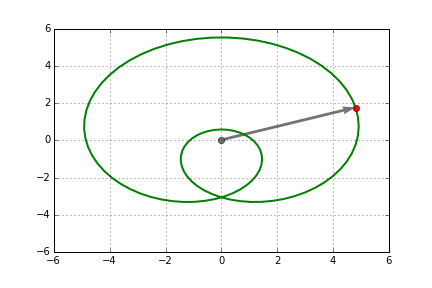
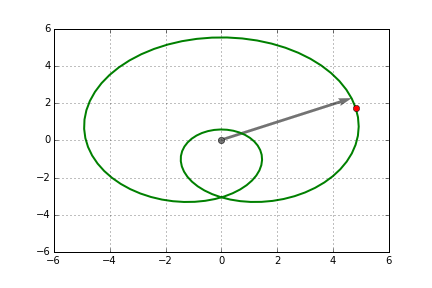
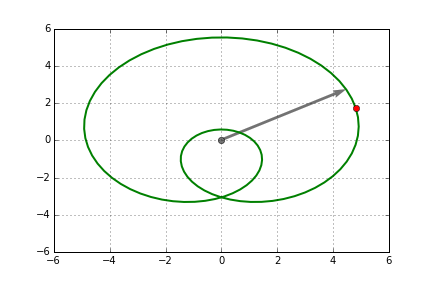
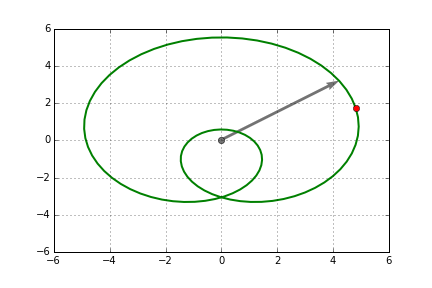
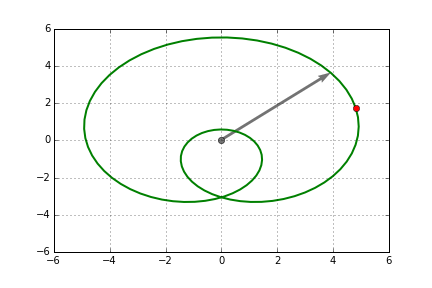
...
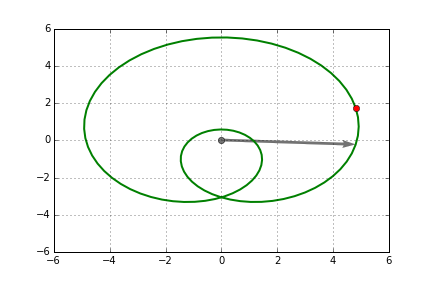
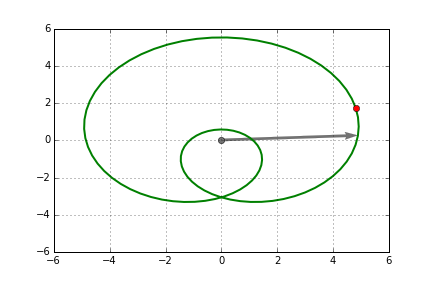
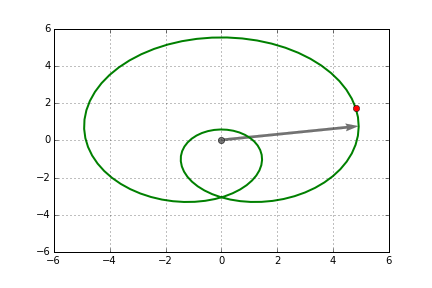
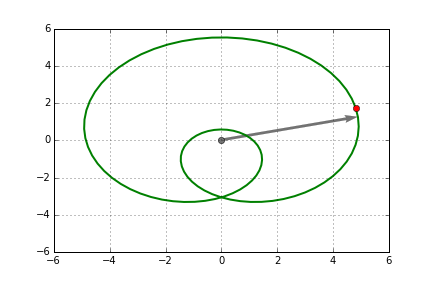
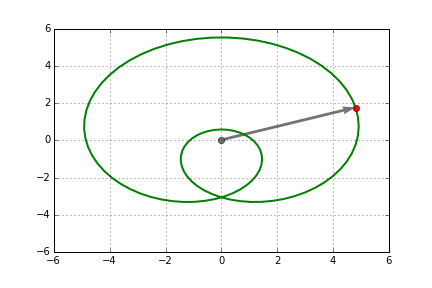

In [3]:
data=np.loadtxt('Gamma.txt')
Gamma=data[:,0]+1j*data[:,1]
anim=winding(Gamma, 0.0, -6,6, -4,6)
IPython_display.display_animation(anim, default_mode='once')  

We can notice  that from the starting  red point and back, the  arrow  is running anti-clockwise two complete cycles, i.e. the winding number is 2.

Now we confirm this observation by using the definition of the winding number.
For, we  unwrap the argument $arg(f(\gamma(t))$, and draw the graph of the lift $\phi=\varphi/2\pi$, with  $\varphi(0)=arg(f(\gamma(0))$. The winding number is in this case
$wind(\gamma, z_0)=\phi(1)-\phi(0))$.

The winding number is:  2.0


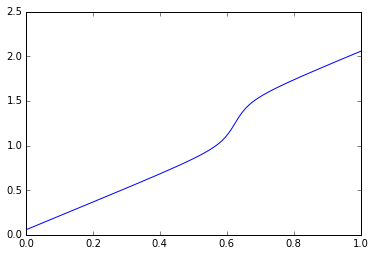

In [4]:
theta=np.angle(Gamma)
phi=np.unwrap(theta)/(2*np.pi)
N=phi.shape[0]
t=np.linspace(0,1,N)
plt.plot(t,phi)
print 'The winding number is: ',phi[N-1]-phi[0]

### The Argument Principle for meromorphic functions


A complex function $f$ is meromorphic on a domain $D\subset \mathbb{C}$ if it is analytic on $D$   except at a set of points which are poles of finite order (no one is an essential singularity).
Example of meromorphic function:

$$f(z)=\displaystyle\frac{(z+2i)e^{ z}}{(z+i)^2(z+5)}$$
$f$ has  a zero, $z_1=-2i$, and three poles:  $p_1=p_2=-i$, $p_3=-5$.

The function $g(z)=z^2e^{1/z}=z^2\sum_{k=0}^\infty z^{-k}/k!$ is not meromorphic on a disk centered at $0$, because $z=0$ is an essential singularity.

The **Argument Priciple** for meromorphic functions states  [[Needham](http://www.amazon.com/Visual-Complex-Analysis-Tristan-Needham/dp/0198534469)]:
    
*Let  $f$ be a meromorphic function  on a domain $D\subset\mathbb{C}$,  and $\gamma:[a,b]\to D$  a piecewise smooth simple loop in $D$, oriented positively.
If $f$ has  $N$ zeros and $P$ poles inside $\Gamma=im(\gamma)$, 
and no other zero or pole belongs to $\Gamma$, then   the winding number of the path $f\circ \gamma:t\mapsto f(\gamma(t))$, with respect to $0$, is $N-P$:*

$$wind(f\circ \gamma, 0)=N-P$$

In other words, the moving  point $f(\gamma(t))$, $t\in[a,b]$, completes $|N-P|$ cycles in its motion about $0$.

When the function $f$ has no poles inside $\Gamma$, it is analytic, and thus the Argument Principle  states  in this case that the winding number is equal to the number of zeros inside $\Gamma$.

For example, the function  $f(z)=(z-2i)(\cos z-1)/(z+1)$ has  three zeros: $z_1=2i$ and $z_2=z_3=0$ (because

$\cos z-1=\displaystyle\sum_{k=0}^\infty (-1)^k \frac{z^{2k}}{(2k)!!}-1=-\frac{z^2}{2}+\frac{z^4}{4!!}+\cdots=z^2g(z)$, with $g(0)\neq 0$), and one pole $p_1=-1$

These zeros  and the pole belong to the open disk $Disk(0, 2.5)$.  Hence we can take $\gamma(t)=2.5e^{2\pi i t}$, $t\in[0,1]$,  as a simple loop  surrounding them. Its $f$-image  is a loop surounding two times (i.e 3-1) the point zero (see the  right plot below):  

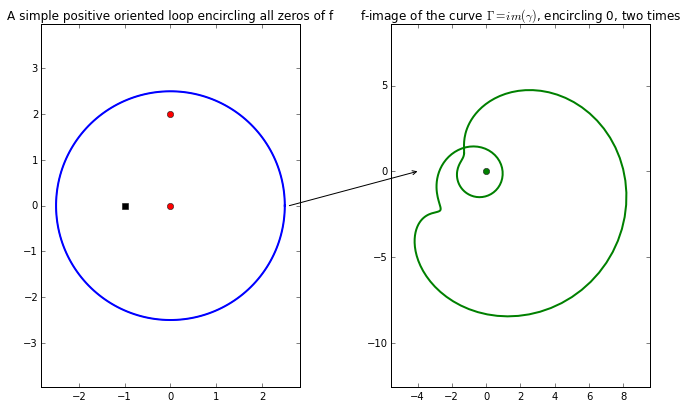

In [5]:
plt.rcParams['figure.figsize'] = 10, 6
from matplotlib.patches import ConnectionPatch

f=lambda z: (z-2*1j)*(np.cos(z)-1)/(z+1)
gamma=lambda t: 2.5*np.exp(2*np.pi*1j*t)
t=np.linspace(0,1, 200)
Gamma=gamma(t)
fG=f(Gamma)
Z=[0+1j*0, 0+2*1j]
pole=-1.0
fig=plt.figure()
ax1=fig.add_subplot(121)
ax1.plot(Gamma.real, Gamma.imag)
for zero in Z:
    ax1.plot(zero.real, zero.imag, 'ro')
ax1.plot(pole.real, pole.imag, 'ks')    
ax1.plot(Gamma.real, Gamma.imag, 'b', lw=2)
ax1.set_title('A simple positive oriented loop encircling all zeros of f')
ax1.axis('equal')

ax2=fig.add_subplot(122)
ax2.plot(0,0, 'go')
ax2.plot(fG.real, fG.imag, 'g', lw=2)
ax2.set_title('f-image of the curve $\Gamma=im(\gamma)$, encircling 0, two times')
ax2.patch.set_facecolor('None')
ax2.axis('equal')
con = ConnectionPatch(xyA=(2.6, 0), xyB=(-4, 0), 
                      coordsA='data', coordsB='data', 
                      axesA=ax1, axesB=ax2,
                      arrowstyle='->', clip_on=False)
ax1.add_artist(con)

plt.tight_layout(2)   

In the sequel we illustrate the Argument Principle through animations. 

We experiment with functions having one or more zeros and/or poles inside a simple loop,  $\gamma(t)= a+re^{2\pi it}$, $t\in [0,1]$. 

We define the function `winding0` that animates the motion of a point according to $t\mapsto f(\gamma(t))$:

In [6]:
def winding0(f,  gamma, xm, xM, ym, yM, nr=100):
   #xm, xM, respectively ym, yM, are axes limits
    
   def pts_gen():#generates points on f(gamma(t))
      t = t0 
      h=1.0/nr  
      while t <= 1.0: 
          tr=gamma( t)
          yield f(tr)
          t+=h
            
   def animate(Z):
      X.append(Z.real)
      Y.append(Z.imag)
      line.set_data(X, Y)
      return line,  
            
   t0=0
   fig=plt.figure()
   ax = fig.add_subplot(111, xlim=(xm, xM), ylim=(ym, yM))
   line, = ax.plot([], [], color=(0, 0.6, 0), lw=3)
   
   ax.grid()
   ax.plot(0, 0, 'ro')#  0 is marked by a red point
   X, Y = [], [] # if Z=f(gamma(t)), X=Z.real, Y=Z.imag
   anim= animation.FuncAnimation(fig, animate, frames=pts_gen, save_count=nr, blit=True,
                                  interval=30, repeat=False)
   return anim

We also define a function  that
calculates  the winding number $wind(f\circ\gamma, 0)$, and  draws the graph of the lift $\varphi/2\pi$, where $\varphi(0)=\arg(f(\gamma(0))$.

In [7]:
def lift(f,gamma, N= 100):
    t=np.linspace(0,1,N)
    Gamma=f(gamma(t))
    theta=np.angle(Gamma)
    phi=np.unwrap(theta)/(2*np.pi)
    wind=phi[N-1]-phi[0]
    print 'The winding number is', wind
    plt.plot(t, phi)

In [8]:
plt.rcParams.update(rcdef)

 The function $f(z)=(z-1)(z+i)^2$ has three zeros inside the open disk $D(0, 1.6)$. Hence if $\gamma(t)=1.6e^{2\pi i t}$, $t\in[0,1]$, then the point $f(\gamma(t))$ moves anticlockwise about $0$ (the red point) and describes three complete cycles, as $t$ varies in $0,1]$:


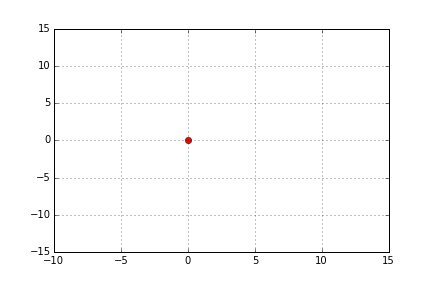
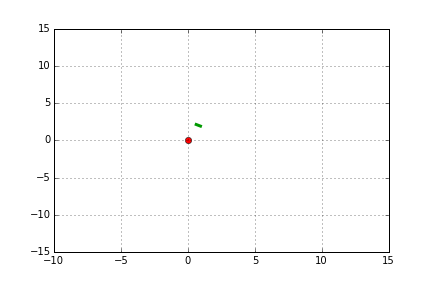
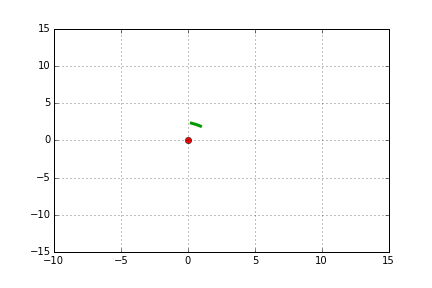
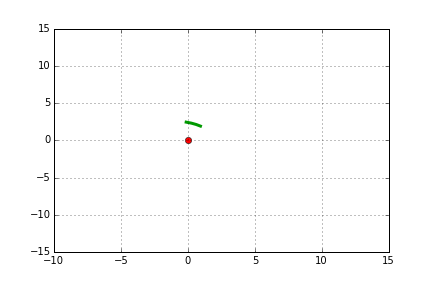
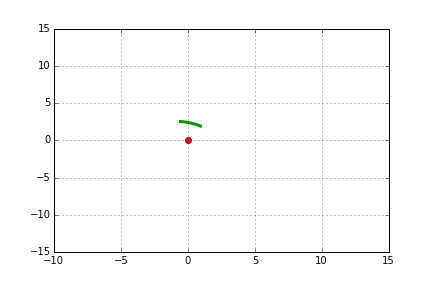
...
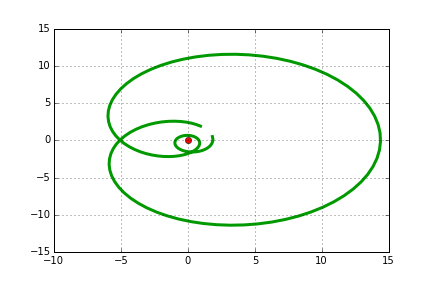
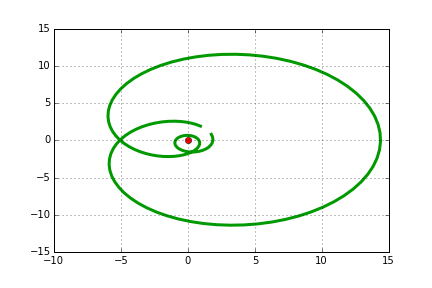
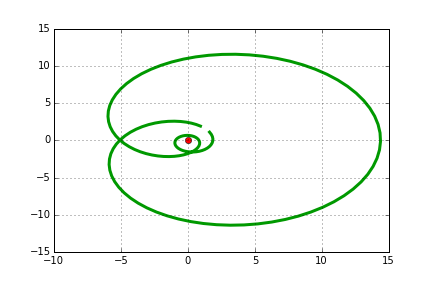
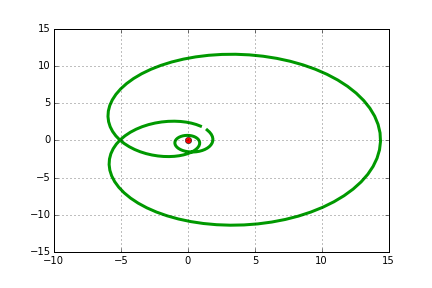
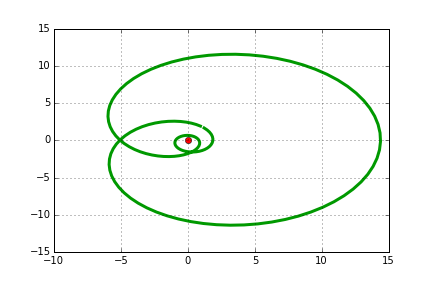

In [9]:
f=lambda z: (z-1)*(z+1j)**2
gamma=lambda t:1.6*np.exp(2*np.pi*1j*t)
anim=winding0(f,gamma, -10,15, -15,15, nr=150)
IPython_display.display_animation(anim, default_mode='once')  

The winding number is 3.0


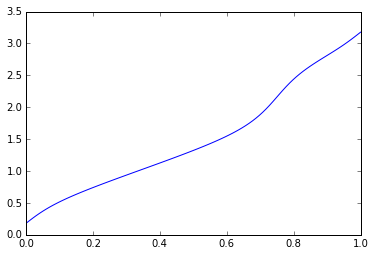

In [10]:
lift(f, gamma)

If  $N-P<0$ the moving point winds clockwise about $0$, describing $|N-P|$ cycles.
The following example illustrates such a case for a function having one zero and three poles inside a loop:


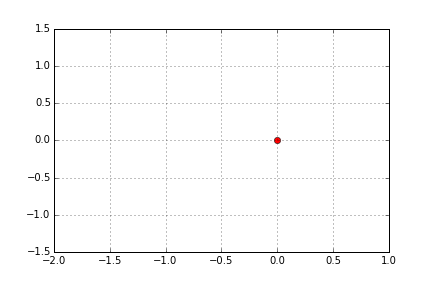
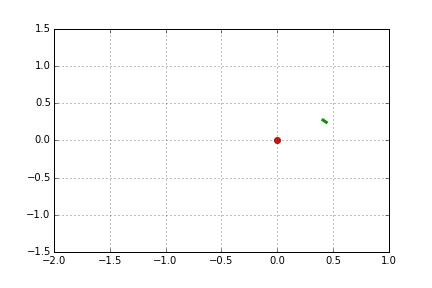
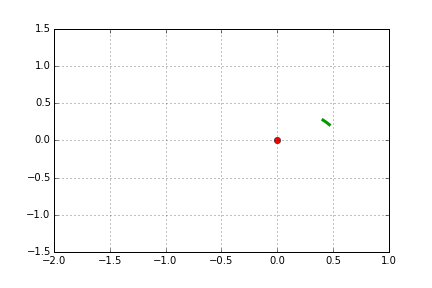
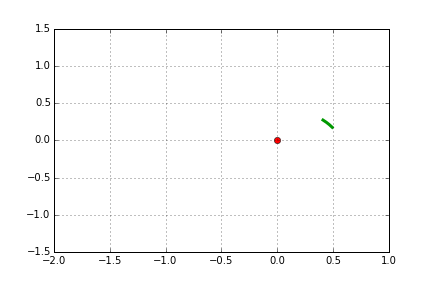
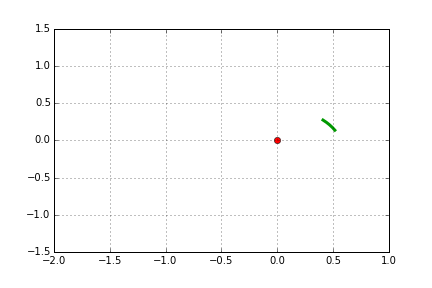
...
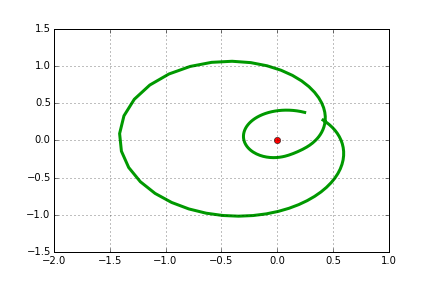
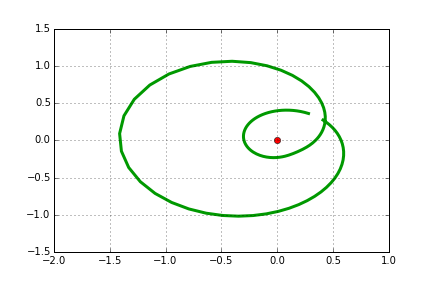
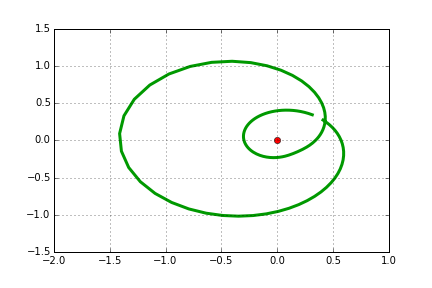
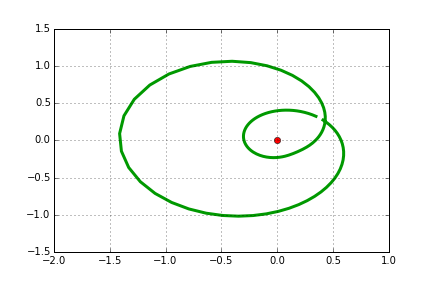
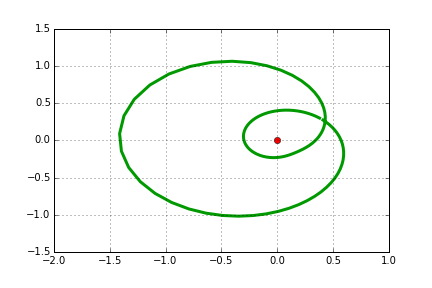

In [11]:
f=lambda z:  (z+0.5)/(z**2*(z-1j))
gamma=lambda t: 1.5*np.exp(2*np.pi*1j*t)
anim=winding0(f,gamma, -2, 1, -1.5, 1.5, nr=150)
IPython_display.display_animation(anim, default_mode='once')  

The winding number is -2.0


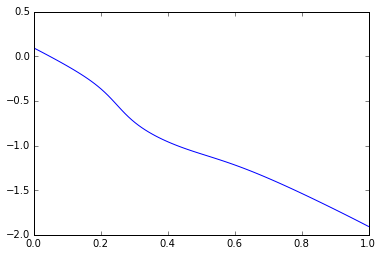

In [12]:
lift(f, gamma, N=100)

If the number of zeros is equal to the number of poles lying inside a simple loop, then  the winding number is $N-P=0$, i.e. the path $t\mapsto f(\gamma(t))$ does not winds around $0$ ($0$ is outside the loop  $im(f\circ \gamma)$).

For example the function:
$$f(z)=\displaystyle\frac{(z-i)\sin z}{(z-3)^2(z+1)}$$
 has   three zeros, $z_1=i$, $z_2=0$, $z_3=\pi$, and three poles:  $p_1=p_2=3$ and $p_3=-1$, within the open disk Disk(1, 2.5). The animation below reveals that  $0$ is not surrounded by the moving point   $f(\gamma(t))$:



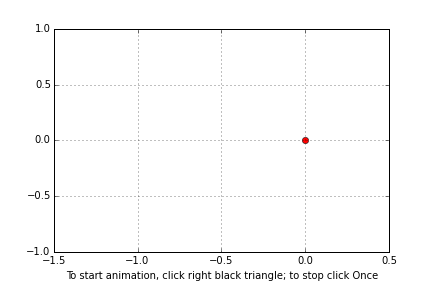
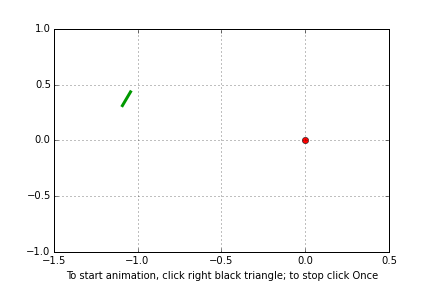
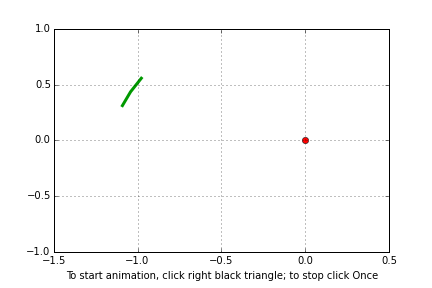
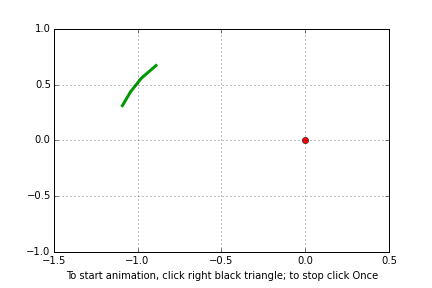
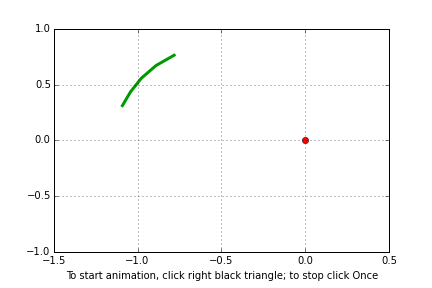
...
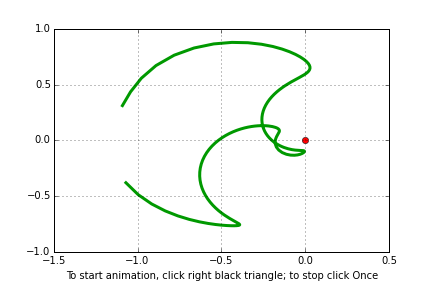
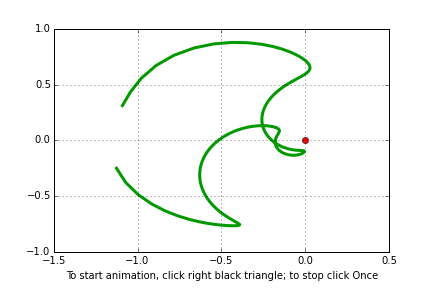
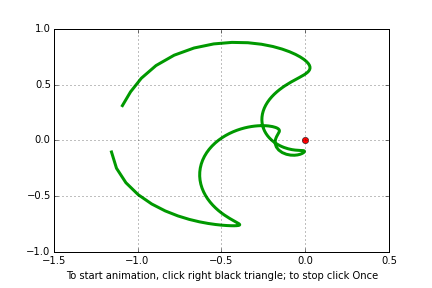
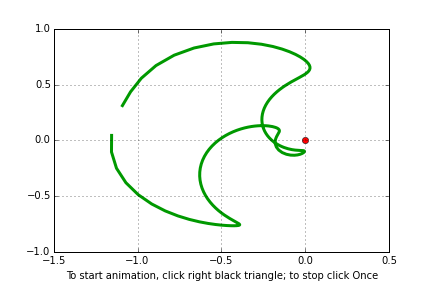
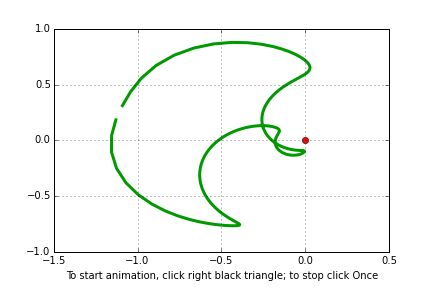

In [13]:
f=lambda z: (z-1j)*np.sin(z)/((z-3)**2*(z+1))
gamma=lambda t: 1+2.5*np.exp(2*np.pi*1j*t)
anim=winding0(f, gamma, -1.5, 0.5, -1,1, nr=175)
plt.xlabel('To start animation, click right black triangle; to stop click Once')
IPython_display.display_animation(anim)  

The winding number is 2.77555756156e-16


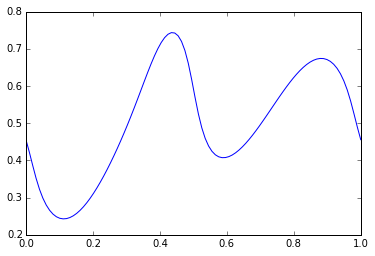

In [14]:
lift(f, gamma)

In a forthcomming IPython Notebook we'll point out the relationship between the winding number and the number of 
isochromatic lines around a zero or a pole of a meromorphic function in a [colored representation](http://nbviewer.ipython.org/github/empet/Math/blob/master/DomainColoring.ipynb)
of that function.

In [1]:
from IPython.core.display import HTML
def  css_styling():
    styles = open("./custom.css", "r").read()
    return HTML(styles)
css_styling()